Authors:
- Aleman Mihnea 12333410
- Babiy Ivan 12142160

In [25]:
import copy

# Iris dataset - 30x15 SOM

This notebook explores the application of **Self-Organizing Maps (SOM)** to the well-known **Iris dataset** using the **PySOMVis** library. SOM is an unsupervised machine learning algorithm that is used for dimensionality reduction and clustering by mapping high-dimensional data into a lower-dimensional 2D grid, preserving the topological relationships of the data.

This notebook uses a 15x30 SOM grid to visualize the relationships and clustering behavior of the Iris dataset, with the PySOMVis library providing various visualization techniques. It also includes an analysis of the results, highlighting how the SOM adapts to the Iris dataset and identifying key patterns in class separation, particularly noting the overlap between Versicolor and Virginica.

In [3]:
from SOMToolBox_Parse import SOMToolBox_Parse

dataset = 'iris' #iris, chainlink, 10clusters, BostonHousing
inputdata = SOMToolBox_Parse('datasets/'+dataset+'/'+dataset+'.vec').read_weight_file()
components = SOMToolBox_Parse('datasets/'+dataset+'/'+dataset+'.tv').read_weight_file()
classinfo = SOMToolBox_Parse('datasets/'+dataset+'/'+dataset+'.cls').read_weight_file()


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
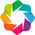

In [4]:
from pysomvis import PySOMVis
from minisom import MiniSom    


m=30
n=15
dim=4
som = MiniSom(m, n, dim, random_seed=1)
som.train(inputdata['arr'], 10000)

### Save machine-actionable description of the model using FAIR4ML schema

In [5]:
import json
import inspect
from jsonschema import validate, ValidationError

# Define the FAIR4ML schema (simplified example)
fair4ml_schema = {
    "type": "object",
    "properties": {
        "model": {"type": "string"},
        "parameters": {"type": "object"},
        "training_data": {"type": "string"},
        "iterations": {"type": "integer"}
    },
    "required": ["model", "parameters", "training_data", "iterations"]
}

# Function to collect metadata
def collect_metadata(model, training_data, iterations):
    parameters = inspect.signature(model.__init__).parameters
    parameters_dict = {k: str(v) for k, v in parameters.items()}  # Convert to serializable format
    metadata = {
        "model": model.__class__.__name__,
        "parameters": parameters_dict,
        "training_data": training_data,
        "iterations": iterations
    }
    return metadata

metadata = collect_metadata(som, 'idata["arr"]', 10000)

# Validate metadata against the FAIR4ML schema
try:
    validate(instance=metadata, schema=fair4ml_schema)
    print("Metadata is valid.")
except ValidationError as e:
    print("Metadata validation error:", e)

# Export metadata to JSON-LD
with open('som_iris30x15_metadata.jsonld', 'w') as f:
    json.dump(metadata, f, indent=4)
print("Metadata exported.jsonld")

Metadata is valid.
Metadata exported.jsonld


### Interactive PySOMVis visualization

Used to experiment different SOM visualizations, parameters, and color schemes.

In [6]:
pysomviz = PySOMVis(weights=som._weights.reshape(m*n,4), m=m, n=n,
                     dimension=dim, input_data=inputdata['arr'], classes_names=classinfo['classes_names'], 
                    classes=classinfo['arr'][:,1], component_names=components['arr'][:,1])
pysomviz._mainview

Column
    [0] Column
        [0] Column
            [0] Row(margin=5, width=700)
                [0] StaticText(value='<b></b>')
                [1] Select(options=OrderedDict([('Component P...]), value=0)
                [2] Select(options=OrderedDict([('PiYG', ...]), value='jet')
                [3] Button(name='↶')
                [4] Button(name='↷')
                [5] Button(name='↔')
                [6] Button(name='↕')
                [7] Checkbox(name='interpolation')
        [1] Row
            [0] Column
                [0] HoloViews(DynamicMap)
            [1] Row
                [0] Column
                    [0] Column(margin=5, name='Component Planes', width=300)
                        [0] StaticText(value='<b>Component Planes</b>')
                        [1] IntSlider(end=3, name='sep_length')
                    [1] Str(str)
    [1] Column
        [0] Row()

In [5]:
for vis in pysomviz._visualizations:
    print(vis)

## Visualization of used colormaps

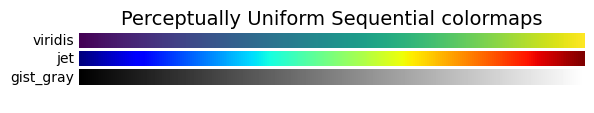

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
cmaps = {}

gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))


def plot_color_gradients(category, cmap_list):
    nrows = len(cmap_list)
    figh = 0.35 + 0.15 + (nrows + (nrows - 1) * 0.1) * 0.22
    fig, axs = plt.subplots(nrows=nrows + 1, figsize=(6.4, figh))
    fig.subplots_adjust(top=1 - 0.35 / figh, bottom=0.15 / figh,
                        left=0.2, right=0.99)
    axs[0].set_title(f'{category} colormaps', fontsize=14)

    for ax, name in zip(axs, cmap_list):
        ax.imshow(gradient, aspect='auto', cmap=mpl.colormaps[name])
        ax.text(-0.01, 0.5, name, va='center', ha='right', fontsize=10,
                transform=ax.transAxes)
    for ax in axs:
        ax.set_axis_off()

    cmaps[category] = cmap_list

plot_color_gradients('Perceptually Uniform Sequential', ['viridis', 'jet', 'gist_gray'])

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
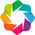

In [7]:
import panel as pn
import holoviews as hv
from holoviews import opts
from skimage.transform import resize
hv.extension('bokeh')

In [8]:
def calculate(visualization_index=0, cmap="jet", title="Visualization", **kwargs):
    print(f"Calculating for {pysomviz._visualizations[visualization_index].__class__.__name__}")
    pysomviz._visualizations[visualization_index]._calculate(**kwargs)
    plot=pysomviz._pipe.data
    return hv.Image(plot).relabel(title).opts(width=n*20, height=m*20).opts(cmap=cmap)

## Component Planes

The Component Planes visualization displays how an individual feature is distributed across the SOM. Each SOM unit is represented as a cell, with color intensity indicating the magnitude of the selected feature value.

In [9]:
calculate(0, "jet", title=f"Component Planes with comp petal length", component=2)

Calculating for ComponentPlane


:Image   [x,y]   (z)

The above Component Planes visualization allows to examine the variation of **petal length** across the 30x15 SOM, clearly displaying the role of this feature in distinguing two clusters, one (the smaller one) likely corresponding to "Setosa", and the other (the larger) likely corresponding to "Versicolor", and "Virginica". One cluster is represented in the bottom right corner, the other in the remaining space of the visualization. This can likely be interpreted as one of the clusters representing data points with extreme values of "petal lenght" and the other one representing data points with more "average" values of "petal lenght".

In [10]:
calculate(0, "jet", title=f"Component Planes with comp petal width", component=3)

Calculating for ComponentPlane


:Image   [x,y]   (z)

The above Component Planes visualization allows to examine the variation of **petal width** across the SOM. Even tough being similar to the previous visualization in the sense that the same cluster is seen in the lower right corner, the rest of the area in the visualization seems to be displaying a mix of very different values, lacking a clear representation of either a "cluster" or a "board".

In [11]:
calculate(0, "jet", title=f"Component Planes with comp sepal width", component=1)

Calculating for ComponentPlane


:Image   [x,y]   (z)

The above Component Planes visualization allows to examine the variation of **sepal width** across the SOM, once more displaying the role of the feature in distinguing two clusters. But this feature, seems to distinguish the data in a slightly different manner, since the bigger (blue) cluster represents a much broader variety of shades, probably meaning that it encompasses a broader range of values of sepal width.

## Hit- Histogram

The Hit Histogram shows the number of data points mapped to each SOM unit. Each unit is represented as a cell, with color intensity indicating the number of hits.

In [12]:
calculate(1, "viridis", title="Hit Histogram")

Calculating for HitHist


:Image   [x,y]   (z)

The figure illustrates a strong concentration in one of the neurons, which indicates a clear cluster. Similar to the 10x10 map, that cluster might indicate the class setosa. However, in this figure we can notice a lot more darker neurons, specifically the lowest values a unit can take in a SOM. This indicates that a lot of units are inactive meaning the map might be too big for representing out dataset. Data is clearly not evenly distributed. 

## U-Matrix

The Unified Distance Matrix (U-Matrix) allows one to visualize the distances between SOM units. Each unit is represented as a cell, with color intensity indicating the distance to its neighbors. High distances (yellow regions) suggest boundaries between clusters, while low distances (blue regions) indicate cluster homogeneity.

U-Matrix helps identify cluster structures and their boundaries within the SOM: dense regions of low distances can be interpreted as data clusters, while areas with high distances usually suggest separation between clusters.

In [13]:
calculate(2, title="U-Matrix")

Calculating for UMatrix


:Image   [x,y]   (z)

The U-Matrix reveals two main well seperated clusters, and inside the smaller cluster another 2 not so well separated cluster. The bigger cluster seems to be less homogeneous, displaying a broader range of shades, when compared to the smaller cluster.

The first cluster - most likely corresponding to "Setosa" - is well-separated with low intra-cluster distances, represented in the U-Matrix above in the lower part of the visualization. The cluster "on the other side" of the boundry - likely corresponding to "Versicolor" and "Virginica" - represent most of the area in the visualization, probably due to the fact that there are twice as much data points that are either "Versicolor" or "Virginica" than there are "Setosa". An explanation on why "Versicolor" and "Virginica" overlap and are represented in a single cluster is most probably due to the known difficulty in linearly separate these two classes.

## D-Matrix

The Density Matrix (D-Matrix) visualizes the density of data points mapped to each SOM unit. Each unit is represented as a cell, with color intensity indicating the number of data points assigned to that unit. High-density regions are shown with more intense colors (blue), while low-density regions are lighter (yellor/red). Dense regions indicate areas of the SOM that represent many similar data points, while sparse regions may reflect data outliers or underpopulated clusters.

In [14]:
calculate(3, title = "D-Matrix")

Calculating for DMatrix


:Image   [x,y]   (z)

The above D-Matrix visualization highlights two key regions of density, similarly to the U-Matrix. Again, the region represented in the bottom, likely corresponding to "Setosa," appears compact and highly concentrated with most data points mapped to a few closely packed units. This is reflective of the well-separated nature of "Setosa".

In contrast, the remaining two species, "Versicolor" and "Virginica", show a broader, more dispersed distribution across multiple units represented in the upper part of the D-Matrix, and once more these units range from varying values (from light yellow to light blue), representing once more the difficulty in recognizing solid cluster(s) and borders(s).

## P-Matrix and U*-Matrix

In [15]:
calculate(4, title = "P-Matrix and U*-Matrix")

Calculating for UStar_PMatrix


:Image   [x,y]   (z)

## Smoothed Data Histograms

Smoothed Data Histograms (SDH) visualize the distribution of data points across the SOM, emphasizing density patterns. Unlike the Hit Histogram, SDH offers a more continuous representation of data concentration.

In [29]:
calculate(5, title = "Smoothed Data Histograms", factor=200, approach=0)

Calculating for SDH


:Image   [x,y]   (z)

Interestingly, we observe a similar pattern to the previous visualization, but with a smoother distribution. This time, the units with the highest value (dark red) do not indicate a large concentration of the class Setosa. Instead, they highlight the opposite, as many data points belong to the similar classes Versicolor and Virginica.

## Pie Chart

The Pie Charts visualization overlays pie charts on SOM units to represent class distribution and density, with the size of each pie chart indicating the number of data points and colored slices showing class proportions. This visualization is most effective when combined with others like U-Matrix or D-Matrix for additional context. It illustrates cluster purity, where single-color pies indicate homogeneous clusters and multi-color pies suggest mixed-class cells, and density distribution, where larger pies mark high-density cells and smaller or absent pies indicate sparse regions.

In [30]:
calculate(6, title = "Pie Chart")
pysomviz._pdmap[0]

Calculating for PieChart


Bokeh(Figure)

The behavior in this situation is quite similar. What's interesting here is that there are only a few pies that include two classes.

## Neighbourhood Graph
The Neighbourhood Graph overlays red lines on an existing SOM visualization to depict the connectivity between SOM units. These lines indicate relationships based on similarity, showing which units are considered neighbors in the high-dimensional space. Cluster connectivity is represented: densely connected regions suggest strongly related data points, while no connections indicate separations between clusters.

In [33]:
image = calculate(7, title = "Neighbourhood Graph", method=1)
image = copy.copy(image)
data = copy.deepcopy(pysomviz._pipe_paths.data)
pipe = hv.streams.Pipe(data=data)
dmap =  hv.DynamicMap(hv.Segments, streams=[pipe]).apply.opts(
    alpha='alpha', 
    line_width=2, 
    color="red"
).opts(width=n*20, height=m*20)
image * dmap

Calculating for NeighbourhoodGraph


:DynamicMap   []
   :Overlay
      .Image.Neighbourhood_Graph :Image   [x,y]   (z)
      .Segments.I                :Segments   [x0,y0,x1,y1]

In this figure, we observe a clear distinction between two groups of lines. The larger group has more intersecting lines, indicating significant mixing. This also suggests a clear boundary between the two groups, as the lower group has no intersecting lines.

## Chess board

The Chess Board visualization emphasizes distinct regions within the SOM, with clear shading differences. It likely highlights cluster membership or classification boundaries, segmenting the SOM into discrete areas.

In [23]:
calculate(8, title = "Chessboard", cmap="gist_gray")

Calculating for Chessboard


:Image   [x,y]   (z)

The Chess Board visualization reveals three primary regions corresponding to the three Iris classes. The Setosa region stands out clearly, while the Versicolor and Virginica regions are adjacent with somewhat blurred boundaries, indicating their known classification overlap.

## Clustering

The Clustering K-Means visualization applies K-Means clustering to the SOM units, grouping them into distinct clusters. Each unit is assigned to a cluster, visualized using different colors to highlight boundaries.

In [36]:
    
calculate(9, title = "Clustering with KMeans", method=0, cmap="gist_gray")

Calculating for Clustering


:Image   [x,y]   (z)

In this figure, we can see a clear separation between the three classes, with the overlay coinciding with the pie chart. However, a downside is that it doesn't show class overlaps. The non-overlapping squares of different colors in the bottom corner might suggest that all classes are nicely distributed, but this would be a wrong assumption, as other visualizations indicate.

## Metro Map

The Metro Map visualization overlays a network-like structure on the SOM grid, splitting it into colored regions while adding metro-style lines that connect different units.

In [47]:
calculate(10, title = "Metro Map", calculating=True)
pysomviz._pdmap[0]

Calculating for MetroMap


HoloViews(Overlay)

Unfortunately, in this figure we have only 2 regions that are clearly separated, while the third one are just unactivated neurons. Therfore we can assume that there is an overlap of class distributions.

## Quantization Error

The Quantization Error visualization measures how well each SOM unit represents the data points assigned to it. High error values indicate that the assigned data points are not well-represented by their corresponding SOM unit, while low values suggest good representation. Higher errors may also suggest class overlap or undertrained regions.

In [38]:
calculate(11, title = "Quantization Error", approach=0)

Calculating for QError


:Image   [x,y]   (z)

In [49]:
calculate(11, title = "Quantization Error", approach=1)

Calculating for QError


:Image   [x,y]   (z)

Both visualizations of the Quantization Error are similar, although the second one appears to show more cells with higher error values. Both display regions with medium and low error. The highest error values are on the right half of the figure, which makes sense since this represents the two classes, Versicolor and Virginica, that are difficult to distinguish. Changing the quantization error results in a similar representation overall.

## SkyMetaphor

The Sky Metaphor visualization provides a smooth, blurred representation of the SOM grid, where color intensity reflects an underlying density metric.

In [42]:
image_sky = calculate(13, title = "SkyMetaphor", cmap="viridis")

points = copy.deepcopy(pysomviz._pipe_points.data)
point_map = hv.DynamicMap(hv.Points, streams=[hv.streams.Pipe(data=points)])
image_sky * point_map

Calculating for SkyMetaphor


:DynamicMap   []
   :Overlay
      .Image.SkyMetaphor :Image   [x,y]   (z)
      .Points.I          :Points   [x,y]

This visualization consistently aligns with the results from all other visualizations. The most interesting aspect is the clear boundary of unactivated neurons in the middle of the map, illustrating the distinct separation between the two clusters.

## Intrinsic Distance Histogram
An intrinsic distance histogram is a graphical representation used to analyze the distribution of intrinsic distances within a dataset. Intrinsic distances are measurements that capture the inherent geometric properties of data points. Same old story here too.

In [43]:
calculate(15, title = "Intrinsic Distance")

Calculating for IntrinsicDistance


:Image   [x,y]   (z)

## Activity Histogram

The Activity Histogram visualizes the activity level of SOM units based on a selected input vector from the dataset. The histogram displays colors representing the distribution of data points across different SOM units, where the size of each color's region indicates its activity level.

In [44]:
calculate(16, title = "Activity Histogram w/ input vec. 30", vec_idx=30)

Calculating for ActivityHist


:Image   [x,y]   (z)

In [9]:
calculate(16, title = "Activity Histogram w/ input vec. 60", vec_idx=60)

Calculating for ActivityHist


:Image   [x,y]   (z)

In [46]:
calculate(16, title = "Activity Histogram w/ input vec. 110", vec_idx=110)

Calculating for ActivityHist


:Image   [x,y]   (z)

The dark orange and red cells represent unactivated units. As the number of input vectors changes, the sizes of the colored regions (blue, red, yellow) shift. Overall, we can once again observe the same two clusters seen in other visualizations.